## Functions and Libraries

In [4]:
import astropy
from mpl_toolkits.mplot3d import Axes3D
from astropy import units as u
from astropy.io import fits
from astropy.coordinates import SkyCoord
from astropy.coordinates import Angle
from astropy.cosmology import WMAP9 as cosmo
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.integrate import quad
from astropy import constants as const


# Importing data

In [5]:
# Correct path to your FITS file
fits_file = fits.open(r'C:\Users\27671\OneDrive\Documents\School\PHY\Year 4\Physics Project\Data\asu (1).fit')
# Print the information about the file
fits_file.info()

# Access the data from the first extension HDU (Header Data Unit)
data = fits_file[1].data  # Adjust the HDU index if necessary

# Get the column names (table headers)
column_names = data.columns.names

# Close the FITS file
fits_file.close()

# Print the column names (table headers)
print("Column Names:", column_names)


Filename: C:\Users\27671\OneDrive\Documents\School\PHY\Year 4\Physics Project\Data\asu (1).fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      45   ()      
  1  VII_250_2dfgrs    1 TableHDU        76   245591R x 15C   [F11.7, F11.7, A6, A10, A11, A11, F6.3, F6.3, F7.4, I1, I1, F5.1, A2, I8, A3]   
Column Names: ['_RAJ2000', '_DEJ2000', 'SeqNum', 'Name', 'RAJ2000', 'DEJ2000', 'Bjmag', 'Bjsel', 'z', 'q_z', 'n_z', 'SNR', 'Sp', 'recno', 'UKST']


In [9]:
# Access the RA column data (replace 'RA' with the actual column name)
ra_column_name = 'RAJ2000'
de_column_name = 'DEJ2000'
Bjsel_column_name= 'Bjsel' #we want this column because it takes into account of extinction
z_column_name = 'z'# Adjust this to match the actual column name
ra_data = data[ra_column_name] #
de_data = data[de_column_name] #measured in degrees , minutes and arcminutes
z_data = data[z_column_name]
magnitude=data[Bjsel_column_name]


# Functions and Constants

In [10]:
c = const.c.to(u.km / u.s) #[km/s]
print(f"The speed of light is {c}")

The speed of light is 299792.458 km / s


In [22]:
def radius (z):
    #created this function to convert the redshift to Mpc and give us the distance to object
    c = 299792.458 #[km/s]
    h_o = 70 # [km/(s Mpc)]
    r = (((z + 1)**2 - 1)/((z + 1)**2 + 1)) * (c/h_o) # [Mpc]
    return abs(r)

def red_to_velo(z):
    #this converts the redshift to 
    c = 299792.458 #[km/s]
    v = (((z + 1)**2 - 1)/((z + 1)**2 + 1))*c #[km/s]
    return v

def d_to_v(galaxy):
    #galaxy units must be cartesian
    r = np.sqrt(galaxy[0]**2 + galaxy[1]**2 + galaxy[2]**2)
    h_o = 70 #km/s Mpc
    v = h_o*r
    return v

def schechter_function(M, M_star, alpha, phi_star):
    return (np.log(10)/2.5)*phi_star * (10)**(0.4*(alpha +1)*(M-M_star))*np.exp(-10**(0.4*(M-M_star)))
            
def M_lim(m_lim):
    V_fid = 1000 #[km/s]
    return m_lim-25-5*np.log(radius(V_fid))
            
def M_ij(m_lim, z_ini):
    v = z_ini #[km/s]
    return m_lim-25-5*np.log(v)

def linking_parameters(m_lim, z_ini):
    V_o = 600  # [km/s]
    D_o = 0.52  # [Mpc]

    # Ensure M_ij and M_lim are properly defined before integration
    M_ij_val = M_ij(m_lim, z_ini)  # Needs definition
    M_lim_val = M_lim(m_lim)
    
    factor_1 = quad(lambda x: schechter_function(x, M_star=-19.40, alpha=-1.30, phi_star=0.0143), -100, M_ij_val)[0]
    factor_2 = quad(lambda x: schechter_function(x, M_star=-19.40, alpha=-1.30, phi_star=0.0143), -100, M_lim_val)[0]

    R = (factor_1 / factor_2) ** (-1/3)
    V_L = V_o * R
    D_L = D_o * R

    return (V_L, D_L)

def V_correction(galaxy):
    V_in = 300  # [km/s]
    
    # Define reference angles correctly
    alpha_v = Angle(187.66196664* u.deg).radian  # RA in hour angle
    gamma_v = Angle(12.04084123* u.deg).radian # Dec in degrees
    
    # Convert galaxy coordinates to SkyCoord object
    coord = SkyCoord(ra=galaxy[0] * u.hourangle, dec=galaxy[1] * u.deg, frame='icrs')
    galactic_coord = coord.galactic  # Convert to galactic coordinates

    # Corrected velocity calculation
    V_V = V_in * (np.sin(coord.ra.radian) * np.sin(alpha_v) +
                  np.cos(coord.dec.radian) * np.cos(gamma_v) *
                  np.cos(coord.ra.radian - alpha_v))

    V_G = V_in * np.sin(galactic_coord.l.radian) * np.cos(galactic_coord.b.radian)
    
    # Convert redshift to velocity and apply corrections
    galaxy[2] = red_to_velo(galaxy[2]) - V_V - V_G  # [km/s]

    # Apply threshold correction
    galaxy[2] = max(galaxy[2], 300)  # Ensure velocity is at least 300 km/s
    
    return galaxy  # Returning corrected velocity

def z_shift(v):
    z=np.sqrt((1 + (v/(3*10**5))) / (1-(v/(3*10**5))))-1
    return z

def angular_separation(lon1, lat1, lon2, lat2):
    coord1 = SkyCoord(ra=lon1 * u.deg, dec=lat1 * u.deg, frame='icrs')
    coord2 = SkyCoord(ra=lon2 * u.deg, dec=lat2 * u.deg, frame='icrs')
    sep = coord1.separation(coord2)
    return sep.radian  # Return separation in radians

# Data Prep

In [12]:
ra_hour_data = [Angle(ra_data[i],unit=u.hourangle).hour for i in range(len(ra_data))] #convert to purely hour
de_deg_data = [Angle(de_data[i],unit=u.deg).deg for i in range(len(de_data))] #convert to purely degree



#This is for the wrap around
new_ra_hour_data=[]
for i in range(len(ra_hour_data)):
    if ra_hour_data[i]>20:
        new_data=ra_hour_data[i]-24
        new_ra_hour_data.append(new_data)
    else:
        new_ra_hour_data.append(ra_hour_data[i])
        
        
#Define the filament you want to analyze
coordinates = [[new_ra_hour_data[i], de_deg_data[i], z_data[i]] for i in range(len(new_ra_hour_data)) if 0.04 < z_data[i] < 0.085 and -32 < de_deg_data[i] <-25 and  -2< new_ra_hour_data[i] <2]
#correct the velocities
coordinates_1 = [V_correction(coordinates[i]) for i in range(len(coordinates))]#this is gonna have a redshift ito velocity       

subset_z_data = [z_shift(coordinates_1[i][2]) for i in range(len(coordinates_1))] # Take it back to z
subset_ra_hour_data =[coordinates_1[i][0] for i in range(len(coordinates_1))]
subset_de_deg_data =[coordinates_1[i][1] for i in range(len(coordinates_1))]

z_min = min(subset_z_data)
z_max = max(subset_z_data)

## plot the data you're gonna do analysis on

In [13]:
import plotly.graph_objects as go
z = subset_z_data
y = subset_de_deg_data
x = subset_ra_hour_data



# Create a 3D scatter plot
fig = go.Figure(data=go.Scatter3d(
    x=subset_ra_hour_data,
    y=subset_de_deg_data,
    z=subset_z_data,
    mode='markers',
    marker=dict(
        size=1,
        color=subset_z_data,              # Set color to an array/list of values
        colorscale='Viridis',      # Choose a colorscale
        opacity=0.8
    )
))

# Set plot title and axis labels
fig.update_layout(
    title='Celestial Coordinates Plot',
    scene=dict(
        xaxis=dict(title='Right Ascension (Hours)', range=[-1, 2]),
        yaxis=dict(title='Declination (degrees)'),
        zaxis=dict(title='Redshift (km/h)')
    )
)

# Show the plot
fig.show()


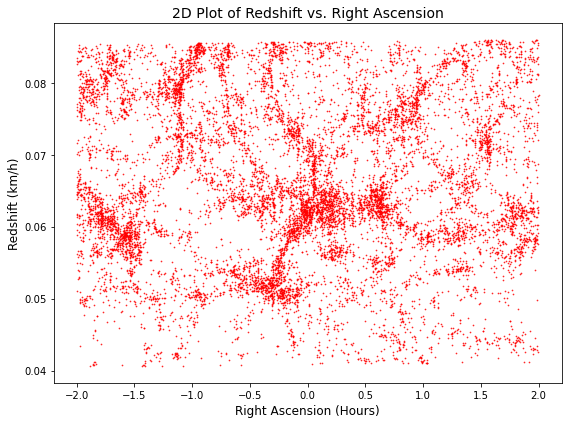

In [17]:
# Sample data for demonstration
x = subset_ra_hour_data  # Replace this with your subset_ra_hour_data
z = subset_z_data # Replace this with your subset_z_data

# Create a scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(x, z, color='red', s=0.5, alpha=0.8)

# Set plot title and axis labels
plt.title('2D Plot of Redshift vs. Right Ascension', fontsize=14)
plt.xlabel('Right Ascension (Hours)', fontsize=12)
plt.ylabel('Redshift (km/h)', fontsize=12)


# Show the plot
plt.tight_layout()
plt.show()


In [18]:
cartesian_og_coordinates = [SkyCoord(ra=x[i]*u.hour, dec=y[i]*u.deg, distance=radius(z[i])*u.Mpc) for i in range(len(x))]
cartesian_og = [coord.cartesian.xyz.to(u.Mpc).value for coord in cartesian_og_coordinates]
x_vals, y_vals, z_vals = zip(*cartesian_og)

# Create interactive plot
fig = go.Figure(data=[go.Scatter3d(
    x=x_vals, y=y_vals, z=z_vals,
    mode='markers',
    marker=dict(
        size=0.5,
        color='red',  # Color by Z for subtle depth cue
        opacity=0.7
    )
)])

fig.update_layout(
    scene=dict(
        xaxis_title='X [Mpc]',
        yaxis_title='Y [Mpc]',
        zaxis_title='Z [Mpc]'
    ),
    title='Interactive 3D Galaxy Distribution',
    margin=dict(l=0, r=0, b=0, t=30)
)

fig.show()


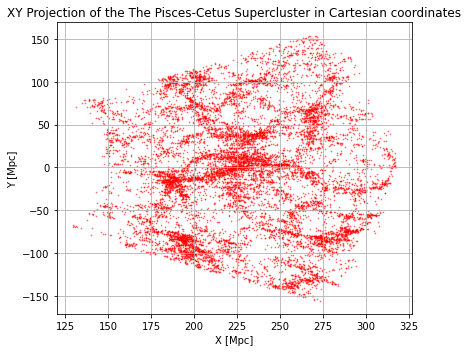

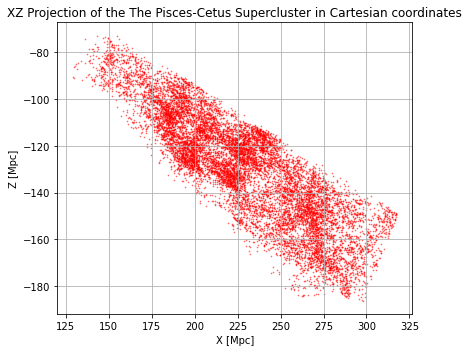

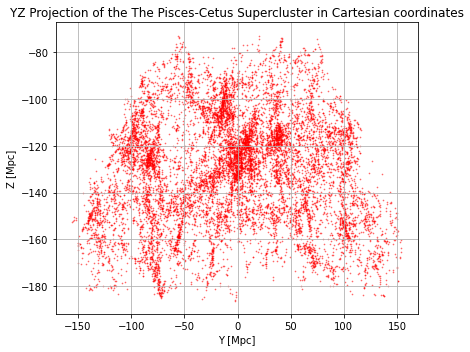

In [19]:
import matplotlib.pyplot as plt

# XY Projection
plt.figure(figsize=(6, 5))
plt.scatter(x_vals, y_vals, s=0.5, alpha=0.5, color='red')
plt.title('XY Projection of the The Pisces-Cetus Supercluster in Cartesian coordinates')
plt.xlabel('X [Mpc]')
plt.ylabel('Y [Mpc]')
plt.grid(True)
plt.tight_layout()
plt.show()

# XZ Projection
plt.figure(figsize=(6, 5))
plt.scatter(x_vals, z_vals, s=0.5, alpha=0.5, color='red')
plt.title('XZ Projection of the The Pisces-Cetus Supercluster in Cartesian coordinates')
plt.xlabel('X [Mpc]')
plt.ylabel('Z [Mpc]')
plt.grid(True)
plt.tight_layout()
plt.show()

# YZ Projection
plt.figure(figsize=(6, 5))
plt.scatter(y_vals, z_vals, s=0.5, alpha=0.5, color='red')
plt.title('YZ Projection of the The Pisces-Cetus Supercluster in Cartesian coordinates')
plt.xlabel('Y [Mpc]')
plt.ylabel('Z [Mpc]')
plt.grid(True)
plt.tight_layout()
plt.show()

## Implementation of Friends of Friends Algorithm

In [20]:
sample_galaxies = coordinates_1

In [23]:
groups = {}
unified_groups = {}
isolated_groups = {}

z_ini = z_min
z_max = z_max
v_ini = red_to_velo(abs(z_ini))

delta_z = 5*10**(-4)
N_min = 3

while z_max > z_ini:
    sample_galaxies_z_ini=[sample_galaxies[i] for i in range(len(sample_galaxies)) if abs(v_ini-sample_galaxies[i][2])<1000]
    galaxies_checked = len(sample_galaxies_z_ini)
    
    
    print(f'z_ini: {z_ini} galaxies_checked: {galaxies_checked}' )
    
    while galaxies_checked > 0:
        galaxy_1 = sample_galaxies_z_ini[galaxies_checked-1]
        galaxies_checked -= 1
        

        groups.setdefault(z_ini, [])  # Ensure z_ini exists applied A.I 

        if not groups[z_ini]:  # If group is empty
            parameters = linking_parameters(13.348, abs(z_ini))
            v_ini = red_to_velo(abs(z_ini))
            V_I = abs(galaxy_1[2] - v_ini)
            V_L = parameters[0]
            #print(f"V_I: {V_I} and V_L:{V_L/2}")

            if V_I <= V_L/2:
                group_candidate_k = [galaxy_1]

                for galaxy_2 in sample_galaxies_z_ini[:]:  # Using slicing for efficiency
                    if galaxy_2 not in group_candidate_k and galaxy_2 != galaxy_1:
                        D_ij = 2 * np.sin(angular_separation(galaxy_1[0], galaxy_1[1], galaxy_2[0], galaxy_2[1]) / 2) * radius(z_ini)
                        V_J = abs(galaxy_2[2] - v_ini)
                        D_L = parameters[1]
                        #print(f"V_J: {V_J} and V_L:{V_L/2} and D_ij: {D_ij} and D_L: {D_L/2}")

                        if D_ij <= D_L and V_J <= V_L/2:
                            group_candidate_k.append(galaxy_2)
                            search_friends = True

                            while search_friends == True:
                                search_friends = False
                                for galaxy_3 in group_candidate_k:
                                    for galaxy_4 in sample_galaxies_z_ini[:]:
                                        if galaxy_4 not in group_candidate_k:
                                            D_ij = 2 * radius(z_ini) * np.sin(angular_separation(galaxy_3[0], galaxy_3[1], galaxy_4[0], galaxy_4[1]) / 2)
                                            V_J = abs(galaxy_4[2] - v_ini)
                                            
                                            if D_ij <= D_L and V_J <= V_L/2:
                                                group_candidate_k.append(galaxy_4)
                                                search_friends = True

                if len(group_candidate_k) >= N_min:
                    groups[z_ini].append(group_candidate_k)
                    print(f"Added group with {len(group_candidate_k)} galaxies.")
                else:
                    isolated_groups.setdefault(z_ini, [])  # Ensure z_ini exists in isolated_groups
                    isolated_groups[z_ini].append(group_candidate_k)  # Append instead of using lists as keys
                    print("Added to isolated groups.")

    z_ini += delta_z  # Incrementing redshift
    
    
#V_L/2=299.9997393733936 and D_L/2=0.2599997741236078

z_ini: 0.04057257522304791 galaxies_checked: 266
Added to isolated groups.
Added to isolated groups.
Added to isolated groups.
Added to isolated groups.
Added to isolated groups.
Added to isolated groups.
Added to isolated groups.
Added group with 9 galaxies.
z_ini: 0.041072575223047914 galaxies_checked: 266
Added to isolated groups.
Added to isolated groups.
Added to isolated groups.
Added to isolated groups.
Added to isolated groups.
Added to isolated groups.
Added to isolated groups.
Added group with 14 galaxies.
z_ini: 0.041572575223047914 galaxies_checked: 316
Added group with 6 galaxies.
z_ini: 0.042072575223047914 galaxies_checked: 364
Added group with 8 galaxies.
z_ini: 0.042572575223047915 galaxies_checked: 411
Added group with 7 galaxies.
z_ini: 0.043072575223047915 galaxies_checked: 446
Added to isolated groups.
Added group with 6 galaxies.
z_ini: 0.043572575223047916 galaxies_checked: 487
Added to isolated groups.
Added group with 4 galaxies.
z_ini: 0.044072575223047916 gal

Added to isolated groups.
Added group with 3 galaxies.
z_ini: 0.07107257522304794 galaxies_checked: 1723
Added to isolated groups.
Added to isolated groups.
Added group with 3 galaxies.
z_ini: 0.07157257522304794 galaxies_checked: 1746
Added to isolated groups.
Added group with 3 galaxies.
z_ini: 0.07207257522304794 galaxies_checked: 1795
Added to isolated groups.
Added to isolated groups.
Added to isolated groups.
Added group with 8 galaxies.
z_ini: 0.07257257522304794 galaxies_checked: 1881
Added to isolated groups.
Added to isolated groups.
Added group with 3 galaxies.
z_ini: 0.07307257522304794 galaxies_checked: 1918
Added to isolated groups.
Added to isolated groups.
Added group with 3 galaxies.
z_ini: 0.07357257522304794 galaxies_checked: 1933
Added to isolated groups.
Added group with 3 galaxies.
z_ini: 0.07407257522304794 galaxies_checked: 1951
Added group with 3 galaxies.
z_ini: 0.07457257522304794 galaxies_checked: 1979
Added group with 10 galaxies.
z_ini: 0.07507257522304794

In [26]:
test_groups = groups
test_isolated_groups = isolated_groups
test_unified_groups= {}
keys_to_remove = list(test_groups.keys())
keys_to_remove

[0.04057257522304791,
 0.041072575223047914,
 0.041572575223047914,
 0.042072575223047914,
 0.042572575223047915,
 0.043072575223047915,
 0.043572575223047916,
 0.044072575223047916,
 0.04457257522304792,
 0.04507257522304792,
 0.04557257522304792,
 0.04607257522304792,
 0.04657257522304792,
 0.04707257522304792,
 0.04757257522304792,
 0.04807257522304792,
 0.04857257522304792,
 0.04907257522304792,
 0.04957257522304792,
 0.05007257522304792,
 0.05057257522304792,
 0.05107257522304792,
 0.05157257522304792,
 0.05207257522304792,
 0.052572575223047924,
 0.053072575223047924,
 0.053572575223047925,
 0.054072575223047925,
 0.054572575223047926,
 0.055072575223047926,
 0.055572575223047926,
 0.05607257522304793,
 0.05657257522304793,
 0.05707257522304793,
 0.05757257522304793,
 0.05807257522304793,
 0.05857257522304793,
 0.05907257522304793,
 0.05957257522304793,
 0.06007257522304793,
 0.06057257522304793,
 0.06107257522304793,
 0.06157257522304793,
 0.06207257522304793,
 0.062572575223047

In [27]:
for z in keys_to_remove:
    group_m = test_groups[z][0]
    print(z)
    keys_to_remove.remove(z)
    for galaxy in group_m:
        for w in keys_to_remove:
            if galaxy in test_groups[w][0]:
                #print(f"True in {test_groups[w][0]}")
                group_m+=test_groups[w][0]
                keys_to_remove.remove(w)
        
        test_unified_groups[z]=group_m      

0.04057257522304791
0.042072575223047914
0.04457257522304792
0.04607257522304792
0.04807257522304792
0.04907257522304792
0.05007257522304792
0.05207257522304792
0.055072575223047926
0.05857257522304793
0.05957257522304793
0.06307257522304793
0.06457257522304793
0.06707257522304794
0.06907257522304794
0.07257257522304794
0.07457257522304794
0.07707257522304795
0.07907257522304795
0.08007257522304795
0.08257257522304795
0.08457257522304795


In [29]:
import plotly.graph_objects as go
import plotly.colors as pc


# Use Plotly's qualitative colors for distinct group colors
color_palette = pc.qualitative.Dark24  # 24 distinct high-contrast colors

# Create figure
fig = go.Figure()

# Plot each group with its own distinct color
for idx, (group, coordinates) in enumerate(test_unified_groups.items()):
    x_vals, y_vals, z_vals = zip(*coordinates)  # Extract X, Y, Z coordinates
    
    fig.add_trace(go.Scatter3d(
        x=x_vals, y=y_vals, z=z_vals,
        mode='markers',
        marker=dict(size=2, color=color_palette[idx % len(color_palette)]),  # Assign distinct colors
        name=f'Group {group}'
    ))

# Set labels and title
fig.update_layout(
    title="Interactive 3D Plot of Unified Galaxy Groups",
    scene=dict(
        xaxis_title="X Coordinate",
        yaxis_title="Y Coordinate",
        zaxis_title="Z Coordinate"
    ),
    legend_title="Groups"
)

# Show plot
fig.show()

In [30]:
from astropy.coordinates import SkyCoord
import astropy.units as u
import plotly.graph_objects as go

fig = go.Figure()

# Plot each group with its own distinct color
for idx, (group, coord_list) in enumerate(test_unified_groups.items()):
    # Unpack RA, Dec, cz from the list of triplets
    ra_vals = [coord[0] for coord in coord_list]
    dec_vals = [coord[1] for coord in coord_list]
    cz_vals = [coord[2] for coord in coord_list]

    # Convert redshift velocity (cz) to distance (assuming H0 = 70 km/s/Mpc)
    distances = [(cz / 70) * u.Mpc for cz in cz_vals]

    # Create SkyCoord object
    sky_coords = SkyCoord(ra=ra_vals * u.hour, dec=dec_vals * u.deg, distance=distances)

    # Convert to Cartesian coordinates in Mpc
    cartesian_coords = sky_coords.cartesian.xyz.to(u.Mpc).value
    x_vals, y_vals, z_vals = cartesian_coords

    # Add 3D scatter plot for this group
    fig.add_trace(go.Scatter3d(
        x=x_vals, y=y_vals, z=z_vals,
        mode='markers',
        marker=dict(size=2, color=color_palette[idx % len(color_palette)]),
        name=f'Group {group}'
    ))

# Set labels and title
fig.update_layout(
    title="Interactive 3D Plot of Unified Galaxy Groups",
    scene=dict(
        xaxis_title="X Coordinate",
        yaxis_title="Y Coordinate",
        zaxis_title="Z Coordinate"
    ),
    legend_title="Groups"
)

# Show plot
fig.show()

#  2D projections of clusters

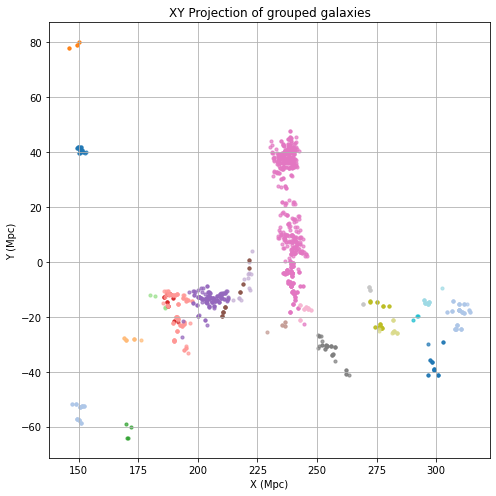

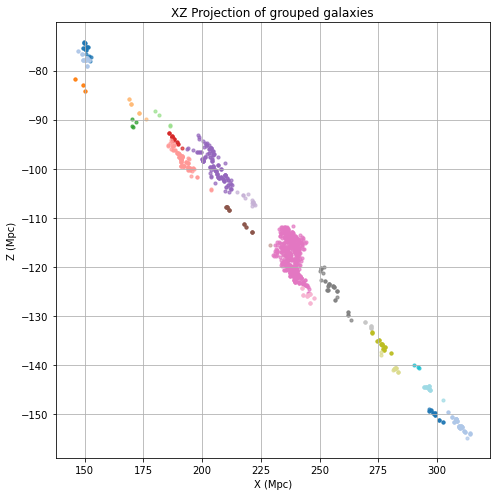

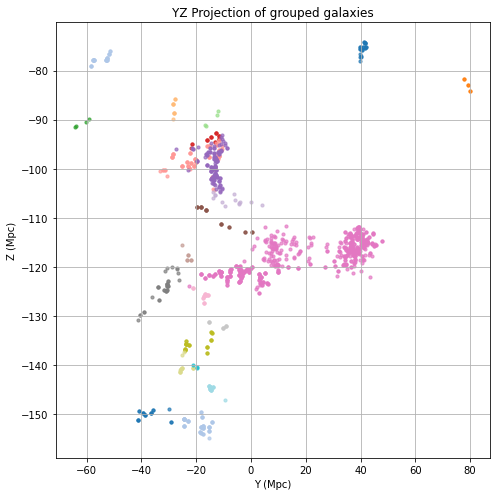

In [33]:
import matplotlib.pyplot as plt
from astropy.coordinates import SkyCoord
import astropy.units as u

# Optional: define your own color palette
import matplotlib.cm as cm
color_palette = cm.get_cmap('tab20').colors

# Loop over projections and plot each separately
projections = [
    ("XY Projection of grouped galaxies", "X (Mpc)", "Y (Mpc)", lambda x, y, z: (x, y)),
    ("XZ Projection of grouped galaxies", "X (Mpc)", "Z (Mpc)", lambda x, y, z: (x, z)),
    ("YZ Projection of grouped galaxies", "Y (Mpc)", "Z (Mpc)", lambda x, y, z: (y, z))
]

for title, xlabel, ylabel, get_proj in projections:
    plt.figure(figsize=(7, 7))
    
    for idx, (group, coord_list) in enumerate(test_unified_groups.items()):
        ra_vals = [coord[0] for coord in coord_list]
        dec_vals = [coord[1] for coord in coord_list]
        cz_vals = [coord[2] for coord in coord_list]
        distances = [(cz / 70) * u.Mpc for cz in cz_vals]
        
        sky_coords = SkyCoord(ra=ra_vals * u.hour, dec=dec_vals * u.deg, distance=distances)
        x, y, z = sky_coords.cartesian.xyz.to(u.Mpc).value
        x_proj, y_proj = get_proj(x, y, z)
        
        plt.scatter(x_proj, y_proj, s=10, color=color_palette[idx % len(color_palette)], label=f"Group {group}", alpha=0.7)

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    #plt.legend(markerscale=2, fontsize='small', loc='best')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# 3D graph of cluster with the sample data

In [35]:
fig = go.Figure()

# Add grouped galaxy data (from test_unified_groups)
for idx, (group, coord_list) in enumerate(test_unified_groups.items()):
    ra_vals = [coord[0] for coord in coord_list]
    dec_vals = [coord[1] for coord in coord_list]
    cz_vals = [coord[2] for coord in coord_list]
    distances = [(cz / 70) * u.Mpc for cz in cz_vals]

    sky_coords = SkyCoord(ra=ra_vals * u.hour, dec=dec_vals * u.deg, distance=distances)
    x1, y2, z3 = sky_coords.cartesian.xyz.to(u.Mpc).value

    fig.add_trace(go.Scatter3d(
        x=x1, y=y2, z=z3,
        mode='markers',
        marker=dict(size=2, color=color_palette[idx % len(color_palette)], opacity=0.8),
        name=f'Group {group}'
    ))
    
# Add ungrouped galaxy data (from unorder_collection_groups)
x_vals, y_vals, z_vals = zip(*cartesian_og)
fig.add_trace(go.Scatter3d(
    x=x_vals, y=y_vals, z=z_vals,
    mode='markers',
    marker=dict(size=0.5, color='black', opacity=0.6)
))

# Final layout
fig.update_layout(
    scene=dict(
        xaxis_title='X [Mpc]',
        yaxis_title='Y [Mpc]',
        zaxis_title='Z [Mpc]'
    ),
    title='Combined 3D Galaxy Distribution',
    margin=dict(l=0, r=0, b=0, t=30),
    legend_title='Galaxy Sets'
)

fig.show()

In [36]:
import plotly.graph_objects as go

# Initialize figures for the three projections
fig_xy = go.Figure()
fig_xz = go.Figure()
fig_yz = go.Figure()

# Grouped galaxies
for idx, (group, coord_list) in enumerate(test_unified_groups.items()):
    ra_vals = [coord[0] for coord in coord_list]
    dec_vals = [coord[1] for coord in coord_list]
    cz_vals = [coord[2] for coord in coord_list]
    distances = [(cz / 70) * u.Mpc for cz in cz_vals]

    sky_coords = SkyCoord(ra=ra_vals * u.hour, dec=dec_vals * u.deg, distance=distances)
    x1, y2, z3 = sky_coords.cartesian.xyz.to(u.Mpc).value

    fig_xy.add_trace(go.Scatter(x=x1, y=y2, mode='markers',
                                marker=dict(size=2, color=color_palette[idx % len(color_palette)], opacity=0.7),
                                name=f'Group {group}'))

    fig_xz.add_trace(go.Scatter(x=x1, y=z3, mode='markers',
                                marker=dict(size=2, color=color_palette[idx % len(color_palette)], opacity=0.7),
                                name=f'Group {group}'))

    fig_yz.add_trace(go.Scatter(x=y2, y=z3, mode='markers',
                                marker=dict(size=2, color=color_palette[idx % len(color_palette)], opacity=0.7),
                                name=f'Group {group}'))

# Ungrouped galaxies
x_vals, y_vals, z_vals = zip(*cartesian_og)

fig_xy.add_trace(go.Scatter(x=x_vals, y=y_vals, mode='markers',
                            marker=dict(size=0.5, color='black', opacity=0.5),
                            name='Ungrouped'))

fig_xz.add_trace(go.Scatter(x=x_vals, y=z_vals, mode='markers',
                            marker=dict(size=0.5, color='black', opacity=0.5),
                            name='Ungrouped'))

fig_yz.add_trace(go.Scatter(x=y_vals, y=z_vals, mode='markers',
                            marker=dict(size=0.5, color='black', opacity=0.5),
                            name='Ungrouped'))

# Customize layouts
for fig, title, x_lab, y_lab in zip(
        [fig_xy, fig_xz, fig_yz],
        ['XY Projection', 'XZ Projection', 'YZ Projection'],
        ['X [Mpc]', 'X [Mpc]', 'Y [Mpc]'],
        ['Y [Mpc]', 'Z [Mpc]', 'Z [Mpc]']):
    
    fig.update_layout(
        title=title,
        xaxis_title=x_lab,
        yaxis_title=y_lab,
        legend_title='Galaxy Sets',
        margin=dict(l=0, r=0, b=0, t=30)
    )

# Show the figures
fig_xy.show()
fig_xz.show()
fig_yz.show()

# 2D Projections of identifiable clusters in the sample

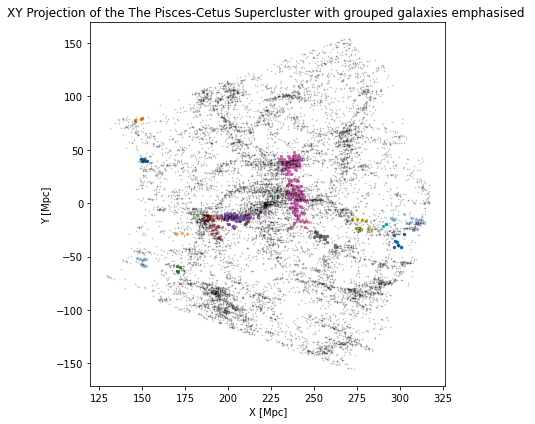

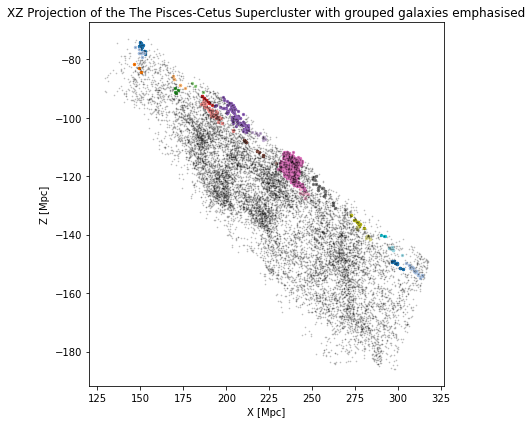

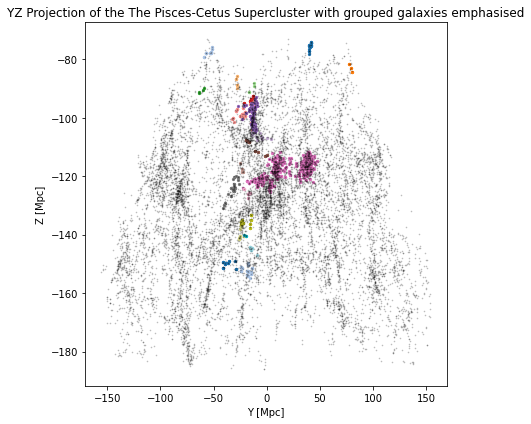

In [38]:
import matplotlib.pyplot as plt

# --- XY Projection ---
plt.figure(figsize=(6, 6))
for idx, (group, coord_list) in enumerate(test_unified_groups.items()):
    ra_vals = [coord[0] for coord in coord_list]
    dec_vals = [coord[1] for coord in coord_list]
    cz_vals = [coord[2] for coord in coord_list]
    distances = [(cz / 70) * u.Mpc for cz in cz_vals]

    sky_coords = SkyCoord(ra=ra_vals * u.hour, dec=dec_vals * u.deg, distance=distances)
    x1, y2, _ = sky_coords.cartesian.xyz.to(u.Mpc).value

    plt.scatter(x1, y2, s=5, color=color_palette[idx % len(color_palette)], alpha=1, label=f'Group {group}')

x_vals, y_vals, _ = zip(*cartesian_og)
plt.scatter(x_vals, y_vals, s=0.5, color='black', alpha=0.2, label='Ungrouped')
plt.title('XY Projection of the The Pisces-Cetus Supercluster with grouped galaxies emphasised ')
plt.xlabel('X [Mpc]')
plt.ylabel('Y [Mpc]')
#plt.legend(markerscale=3, fontsize='small')
plt.tight_layout()
plt.show()

# --- XZ Projection ---
plt.figure(figsize=(6, 6))
for idx, (group, coord_list) in enumerate(test_unified_groups.items()):
    ra_vals = [coord[0] for coord in coord_list]
    dec_vals = [coord[1] for coord in coord_list]
    cz_vals = [coord[2] for coord in coord_list]
    distances = [(cz / 70) * u.Mpc for cz in cz_vals]

    sky_coords = SkyCoord(ra=ra_vals * u.hour, dec=dec_vals * u.deg, distance=distances)
    x1, _, z3 = sky_coords.cartesian.xyz.to(u.Mpc).value

    plt.scatter(x1, z3, s=5, color=color_palette[idx % len(color_palette)], alpha=1, label=f'Group {group}')

x_vals, _, z_vals = zip(*cartesian_og)
plt.scatter(x_vals, z_vals, s=0.5, color='black', alpha=0.2, label='Ungrouped')
plt.title('XZ Projection of the The Pisces-Cetus Supercluster with grouped galaxies emphasised')
plt.xlabel('X [Mpc]')
plt.ylabel('Z [Mpc]')
#plt.legend(markerscale=3, fontsize='small')
plt.tight_layout()
plt.show()

# --- YZ Projection ---
plt.figure(figsize=(6, 6))
for idx, (group, coord_list) in enumerate(test_unified_groups.items()):
    ra_vals = [coord[0] for coord in coord_list]
    dec_vals = [coord[1] for coord in coord_list]
    cz_vals = [coord[2] for coord in coord_list]
    distances = [(cz / 70) * u.Mpc for cz in cz_vals]

    sky_coords = SkyCoord(ra=ra_vals * u.hour, dec=dec_vals * u.deg, distance=distances)
    _, y2, z3 = sky_coords.cartesian.xyz.to(u.Mpc).value

    plt.scatter(y2, z3, s=5, color=color_palette[idx % len(color_palette)], alpha=1, label=f'Group {group}')

_, y_vals, z_vals = zip(*cartesian_og)
plt.scatter(y_vals, z_vals, s=0.5, color='black', alpha=0.2, label='Ungrouped')
plt.title('YZ Projection of the The Pisces-Cetus Supercluster with grouped galaxies emphasised')
plt.xlabel('Y [Mpc]')
plt.ylabel('Z [Mpc]')
#plt.legend(markerscale=3, fontsize='small')
plt.tight_layout()
plt.show()

# Statistics

Summary Statistics:
Total terms: 91
0.04057257522304791: 23 group(s)
0.041072575223047914: 14 group(s)
0.041572575223047914: 6 group(s)
0.042072575223047914: 27 group(s)
0.042572575223047915: 7 group(s)
0.043072575223047915: 6 group(s)
0.043572575223047916: 4 group(s)
0.044072575223047916: 3 group(s)
0.04457257522304792: 6 group(s)
0.04507257522304792: 3 group(s)
0.04557257522304792: 4 group(s)
0.04607257522304792: 9 group(s)
0.04657257522304792: 3 group(s)
0.04707257522304792: 3 group(s)
0.04757257522304792: 3 group(s)
0.04807257522304792: 4 group(s)
0.04857257522304792: 4 group(s)
0.04907257522304792: 4 group(s)
0.04957257522304792: 5 group(s)
0.05007257522304792: 20 group(s)
0.05057257522304792: 8 group(s)
0.05107257522304792: 23 group(s)
0.05157257522304792: 23 group(s)
0.05207257522304792: 94 group(s)
0.052572575223047924: 23 group(s)
0.053072575223047924: 11 group(s)
0.053572575223047925: 34 group(s)
0.054072575223047925: 3 group(s)
0.054572575223047926: 14 group(s)
0.05507257522

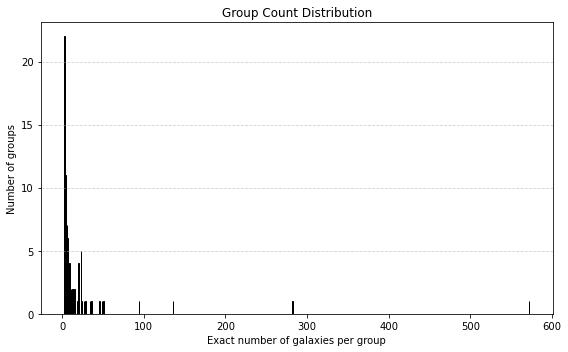

In [39]:
import matplotlib.pyplot as plt
from collections import Counter

import matplotlib.pyplot as plt
from collections import Counter

def summarize_and_barplot(data):
    """
    Summarize dictionary statistics and plot a bar chart
    showing the exact number of groups per term.
    """
    group_sizes = [len(groups[0]) for groups in data.values()]
    size_counts = Counter(group_sizes)

    # Prepare sorted bars
    sizes = sorted(size_counts.keys())
    frequencies = [size_counts[size] for size in sizes]

    # Print summary
    print("Summary Statistics:")
    print(f"Total terms: {len(data)}")
    for term, groups in data.items():
        print(f"{term}: {len(groups[0])} group(s)")

    # Plot bar chart
    plt.figure(figsize=(8, 5))
    plt.bar(sizes, frequencies, color='skyblue', edgecolor='black')
    plt.xlabel("Exact number of galaxies per group")
    plt.ylabel("Number of groups")
    plt.title("Group Count Distribution")
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

summarize_and_barplot(test_groups)

#statistics of data

In [40]:
import pandas as pd

def statistical_summary(data):
    """
    Generate a statistical summary of the group sizes.
    """
    group_sizes = [len(groups[0]) for groups in data.values()]
    df = pd.DataFrame(group_sizes, columns=['Group Size'])

    return df.describe()

print(statistical_summary(test_groups))

       Group Size
count    91.00000
mean     22.10989
std      67.43597
min       3.00000
25%       4.00000
50%       6.00000
75%      15.50000
max     572.00000


In [42]:
def isolated_galaxy_statistics(data):
    one_galaxy=0
    two_galaxy=0
    net_isolated_galaxies=0
    for i in data.values():
        if len(i[0])==1:
            one_galaxy+=1
            net_isolated_galaxies+=1
        elif len(i[0])==2:
            two_galaxy+=1
            net_isolated_galaxies+=2
        
    print(f"Total groups: {one_galaxy+two_galaxy}, number of isolated galaxies: {net_isolated_galaxies}, Single isolated galaxies: {one_galaxy}, isolated groups: {two_galaxy}")

In [43]:
isolated_galaxy_statistics(test_isolated_groups)

Total groups: 41, number of isolated galaxies: 53, Single isolated galaxies: 29, isolated groups: 12


In [45]:
from collections import Counter
from tabulate import tabulate

def frequency_of_group_sizes(data):
    """
    Prints a table showing how many times each group size appears
    among the terms.
    """
    group_sizes = [len(groups[0]) for groups in data.values()]
    frequency = Counter(group_sizes)

    # Prepare table with group size on the left and frequency on the right
    table_data = [(size, freq) for size, freq in sorted(frequency.items())]
    headers = ["Group Size", "Frequency (Number of Terms)"]

    print(tabulate(table_data, headers=headers, tablefmt="grid"))


frequency_of_group_sizes(test_groups)

+--------------+-------------------------------+
|   Group Size |   Frequency (Number of Terms) |
+==============+===============================+
|            3 |                            22 |
+--------------+-------------------------------+
|            4 |                            11 |
+--------------+-------------------------------+
|            5 |                             6 |
+--------------+-------------------------------+
|            6 |                             7 |
+--------------+-------------------------------+
|            7 |                             6 |
+--------------+-------------------------------+
|            8 |                             3 |
+--------------+-------------------------------+
|            9 |                             4 |
+--------------+-------------------------------+
|           11 |                             2 |
+--------------+-------------------------------+
|           12 |                             1 |
+--------------+----

# bibligography
(Simcoe, R. 2004)


(Cen and Ostriker, 1999)


Libeskind et al. (2017)


Colberg et al. (2005)

(Santiago-Bautista et al., 2020)

(Carroll & Ostlie, 2007)

Porter & Raychaudhury, 2005)

(Barkana & Loeb, 2007)

Dav´e et al. (2018)

Cen et al. (1995)

Morris et al. (2022)

Botzler et al. (2002)

## 